## Table of contents:

  * <a href=#Preprocess_scran_morse>Preprocessing morse data using scran</a>
  * <a href=#Checking_marker_genes_saliba>Overlapping marker genes with Saliba</a>

Scanpy/scvi imports

In [1]:
import scvi
import scanpy as sc

In [209]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(6,6) #rescale figures


anndata2ri/rpy2 imports

In [2]:
import anndata2ri
import rpy2
import numpy as np
%load_ext rpy2.ipython

import anndata2ri
anndata2ri.activate()

### Read the main working objects we need to use

In [3]:
morse = sc.read_h5ad('../data/morse/morse_input_scvi.h5ad')
adams = sc.read_h5ad('../data/adams/adams_input_scvi_Macrophage.h5ad')
bal = sc.read_h5ad('../data/bal/bal.h5ad')

### Morse explore

In [159]:
morse.X[:, mt_gene_mask].sum(1)
morse.obs['n_counts']

barcode
AAACCTGGTCATGCCG-1-SC45    3038.0
AAACCTGGTGGTGTAG-1-SC45    5557.0
AAACCTGGTTGTACAC-1-SC45    4771.0
AAACCTGTCACAACGT-1-SC45    8826.0
AAACGGGCACAGCGTC-1-SC45    5150.0
                            ...  
TTGGGAACTACAGC-1-SC31         5.0
TTGGTACTGGACTT-1-SC31         3.0
TTTCAGTGTCACCC-1-SC31         1.0
TTTCCAGAAGTAGA-1-SC31         1.0
TTTCCAGATGTAGC-1-SC31         2.0
Name: n_counts, Length: 9579, dtype: float32

In [183]:
morse.X[:, mt_gene_mask].sum(1)[:,0]

matrix([[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]])

In [206]:
# Quality control - calculate QC covariates
morse.obs['n_counts'] = morse.X.sum(1)
morse.obs['log_counts'] = np.log(morse.obs['n_counts'])
morse.obs['n_genes'] = (morse.X > 0).sum(1)

mt_gene_mask = [gene.startswith('MT-') for gene in morse.var['symbol']]
morse.obs['mt_frac'] = morse.X[:, mt_gene_mask].toarray().sum(1) / morse.obs['n_counts']

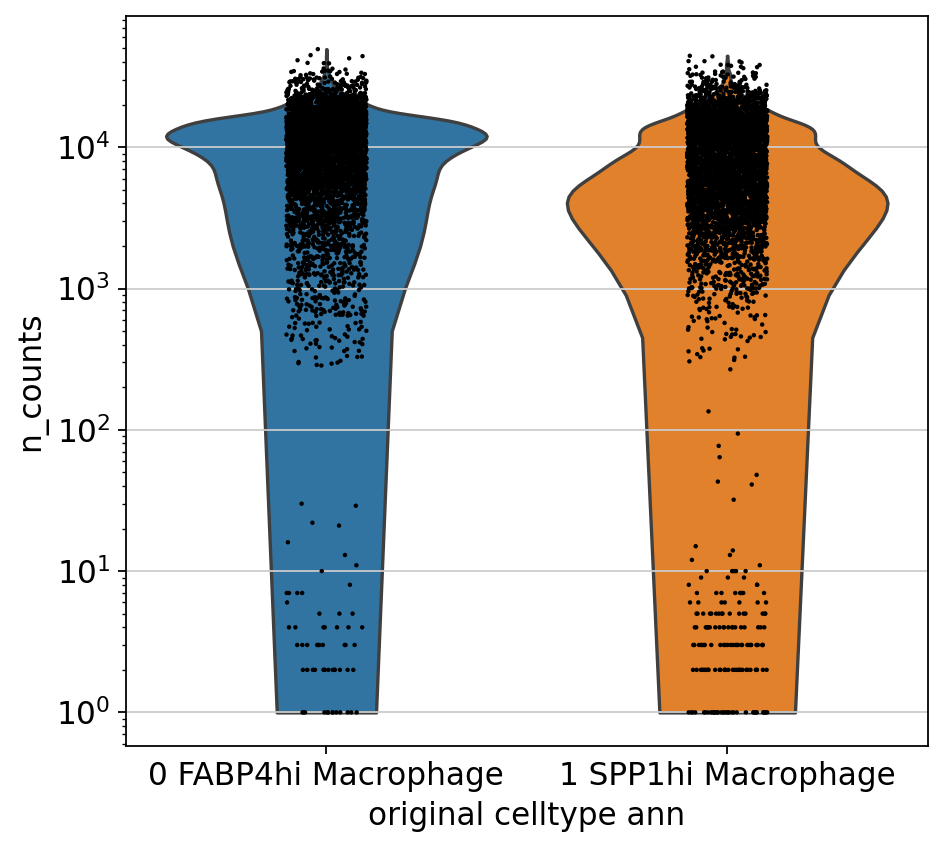

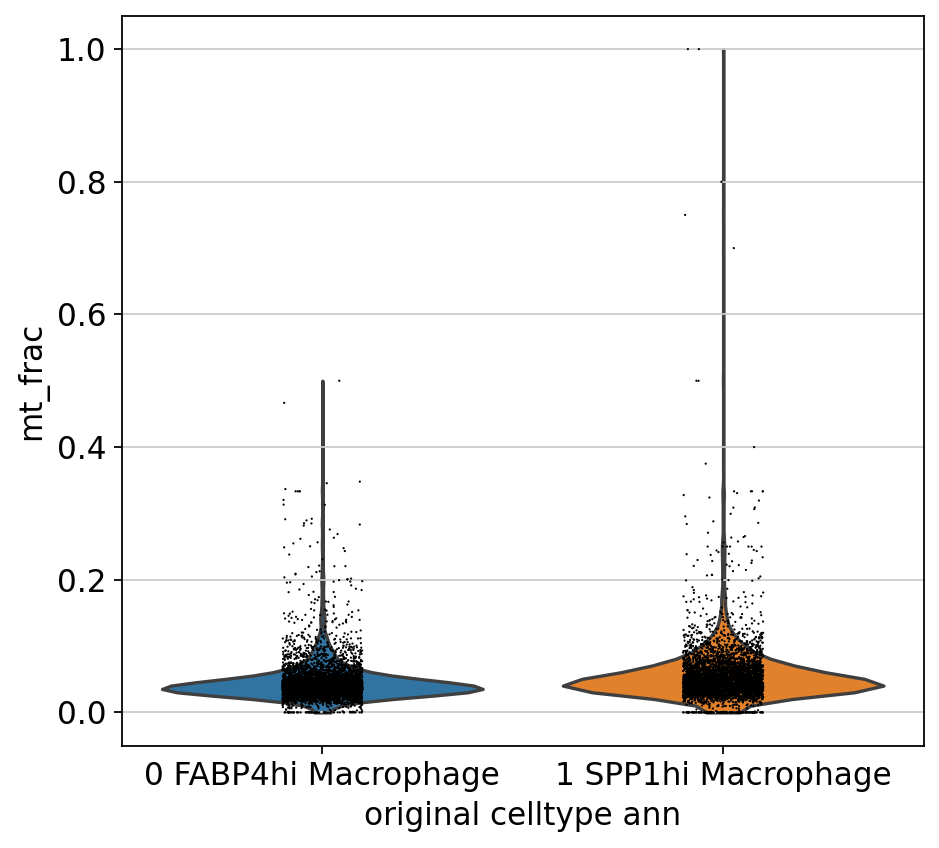

In [210]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(morse, 'n_counts', groupby='original_celltype_ann', size=2, log=True, cut=0)
t2 = sc.pl.violin(morse, 'mt_frac', groupby='original_celltype_ann')

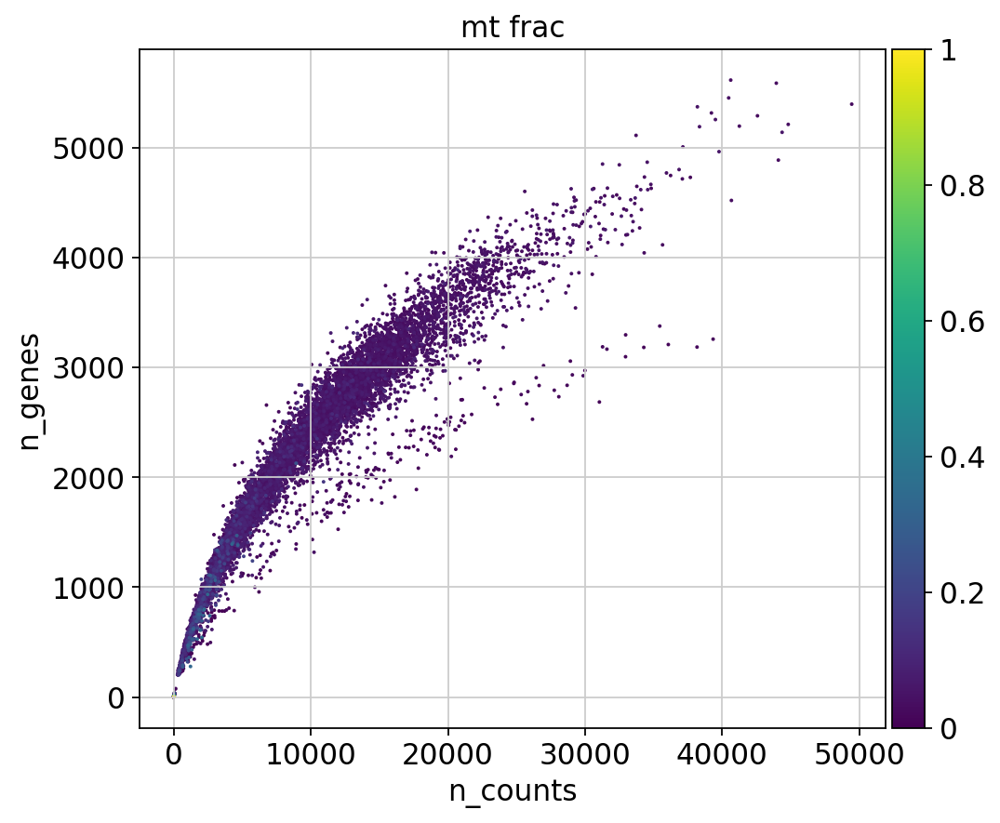

/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


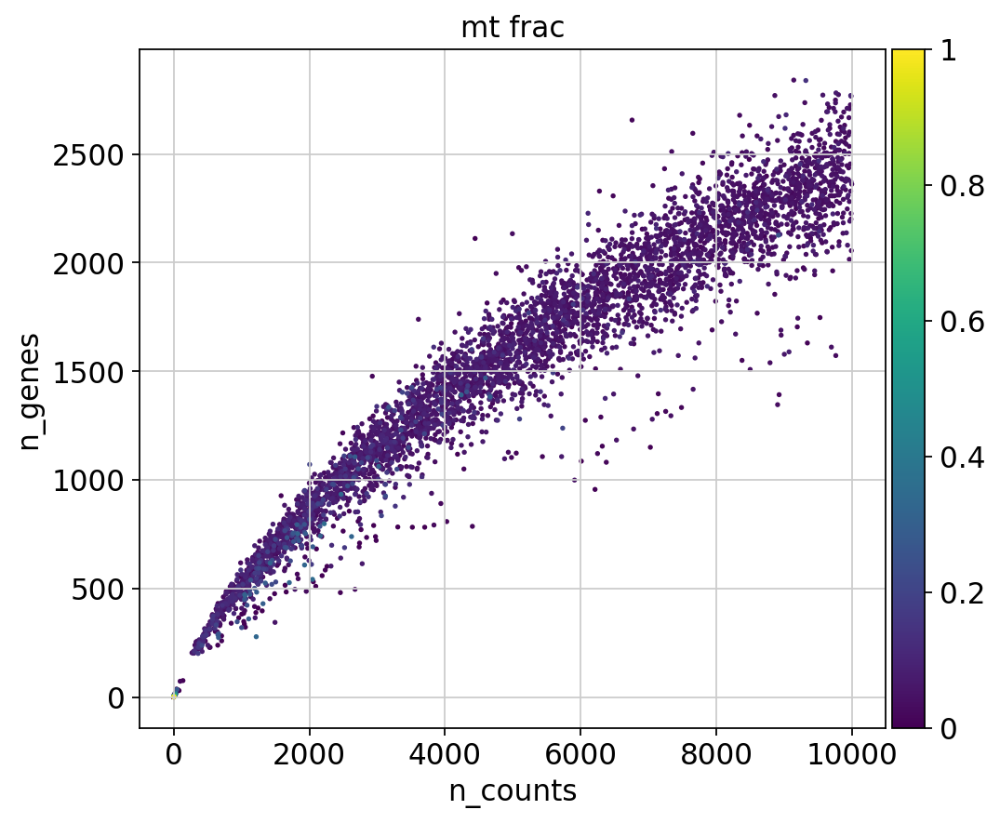

In [211]:
#Data quality summary plots
p1 = sc.pl.scatter(morse, 'n_counts', 'n_genes', color='mt_frac')
p2 = sc.pl.scatter(morse[morse.obs['n_counts'] < 10000], 'n_counts', 'n_genes', color='mt_frac')

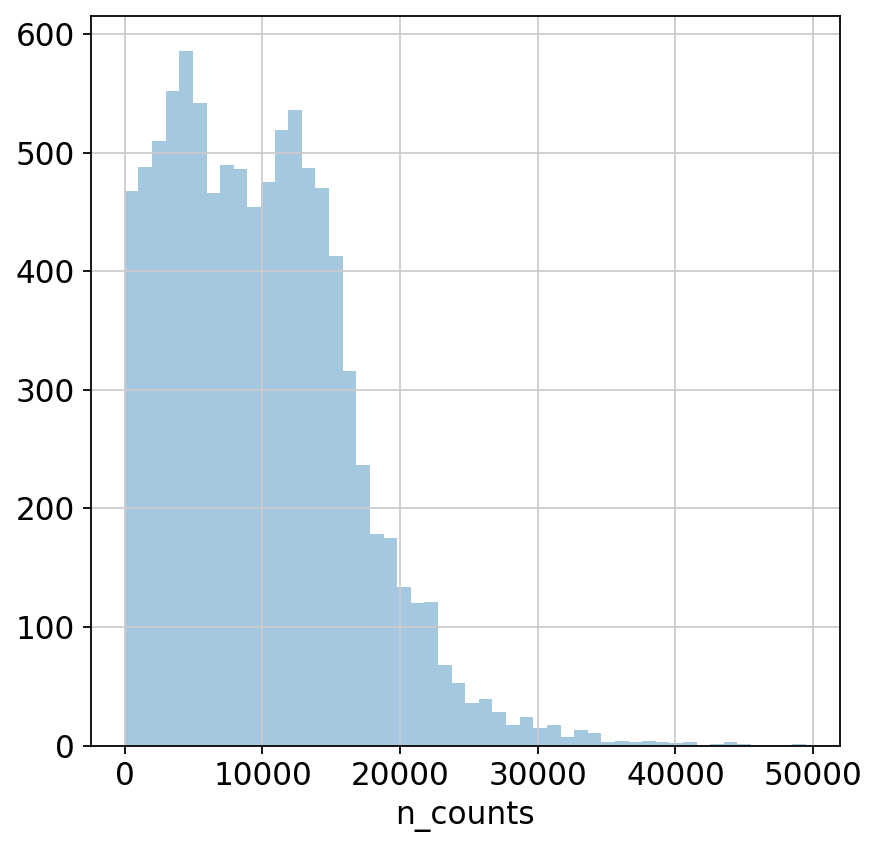

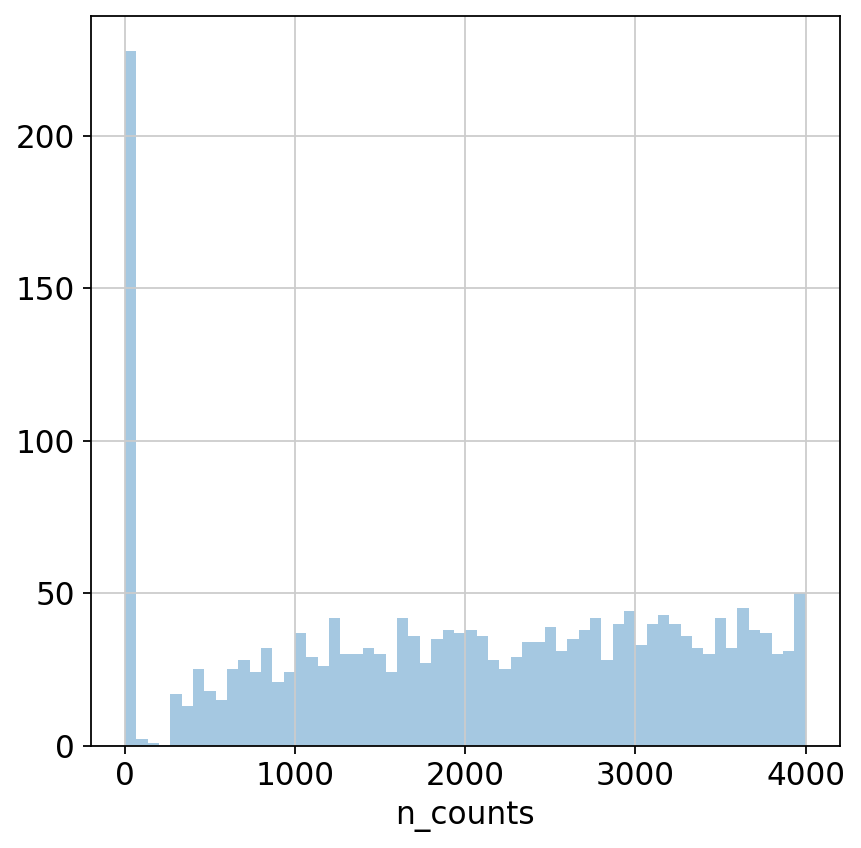

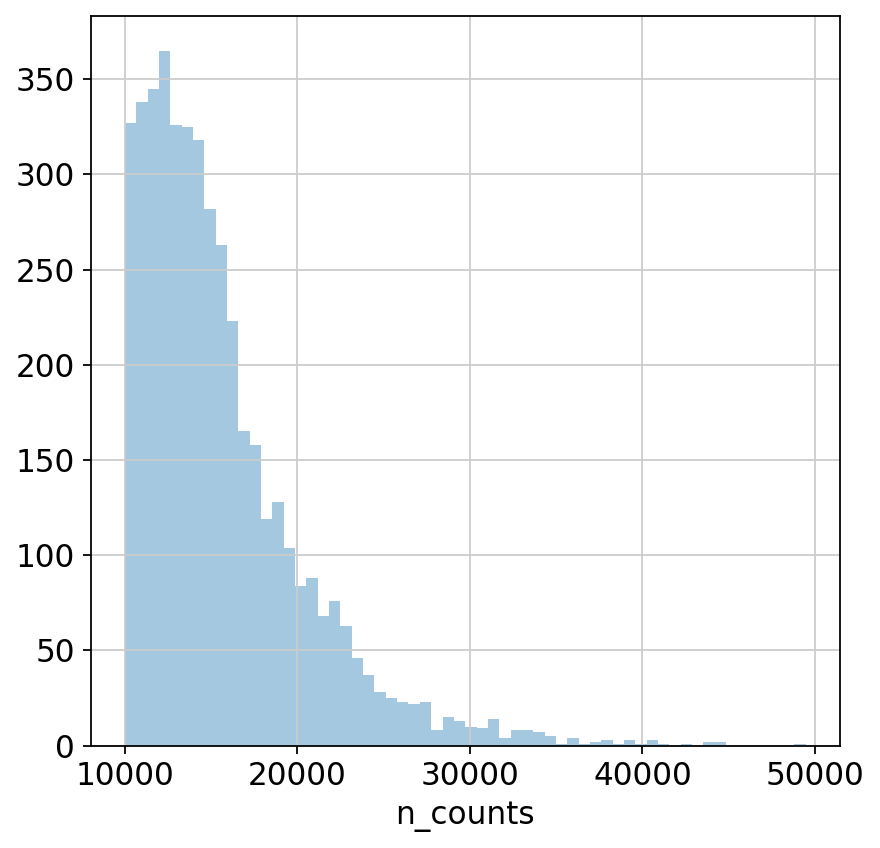

In [215]:
#Thresholding decision: counts
p3 = sns.distplot(morse.obs['n_counts'], kde=False)
plt.show()
p4 = sns.distplot(morse.obs['n_counts'][morse.obs['n_counts']<4000], kde=False, bins=60)
plt.show()
p5 = sns.distplot(morse.obs['n_counts'][morse.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

In [ ]:
morse

### Perform scran normalization in Morse to checkout behavior

Perform a clustering for scran normalization in clusters

In [216]:
print(morse.shape, morse[morse.X.sum(axis=1) > 1000,:].shape)

(9579, 33694) (9106, 33694)


/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


### Morse counts threshold filtering

True     8780
False     253
Name: n_genes, dtype: int64

In [231]:
morse = morse[morse.X.sum(axis=1) > 1000,:]

morse = morse[morse.obs['mt_frac'] < 0.2,:]
morse = morse[morse.obs['n_genes'] > 700,:]
morse

/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 8780 × 33694
    obs: 'GSM', 'sample.id', 'dataset', 'last_author/PI', 'lung_vs_nasal', 'original_celltype_ann', 'sample', 'total_counts', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', "3' or 5'", 'BMI', 'Institute', 'Study_PI', 'age, in years', 'age, range', 'anatomical region coarse', 'anatomical region detailed', 'cause of death', 'cell ranger version', 'cell ranger version ', 'cell viability %', 'cells or nuclei', 'comments', 'condition', 'cultured', 'disease status', 'enrichment', 'enrichment ', 'ensembl release reference genome', 'ethnicity', 'fresh or frozen', 'known lung disease', 'library-construction batch', 'library_ID', 'mixed ethnicity', 'number of cells loaded', 'pre or postnatal', 'publication_ID', 'reference genome coarse', 'relative sample collection timepoint', 'repository_ID', 'sample type

In [240]:
morse_pp = morse.copy()
sc.pp.normalize_per_cell(morse_pp, counts_per_cell_after=1e6)
sc.pp.log1p(morse_pp)
sc.pp.pca(morse_pp, n_comps=15)
sc.pp.neighbors(morse_pp)
sc.tl.louvain(morse_pp, key_added='groups', resolution=0.5)

<a id="Preprocess_scran_morse"></a>

### Preprocess variables for scran normalization
- Important: **Here data_mat has to be an ndarray** otherwise an error is thrown and handling it is most likely hard/not possible (see anndata2ri docs)

In [243]:
input_groups = morse_pp.obs['groups']
data_mat = morse.X.T.toarray()
# data_mat = morse.X.toarray()

In [244]:
%%R -i data_mat -i input_groups -o size_factors
size_factors = computeSumFactors(data_mat, min.mean=.1) # clusters=input_groups, min.mean=0.1)

In [245]:
#Delete morse_pp
del morse_pp

Trying to set attribute `.obs` of view, copying.
/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


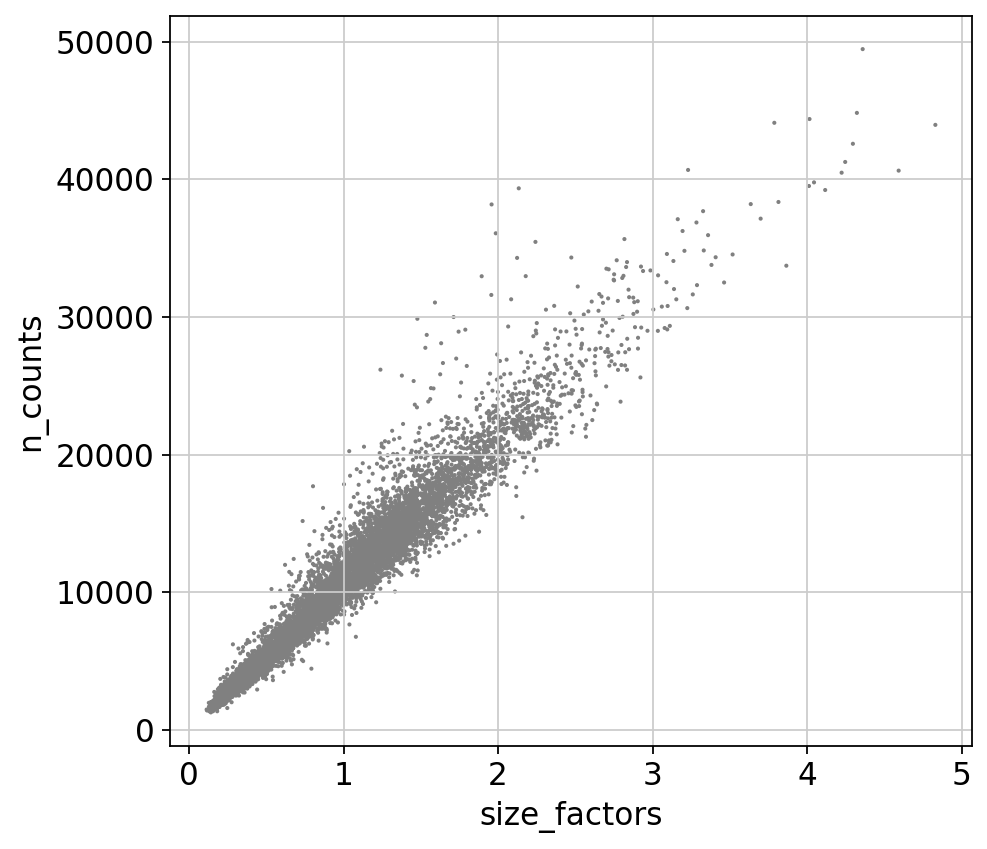

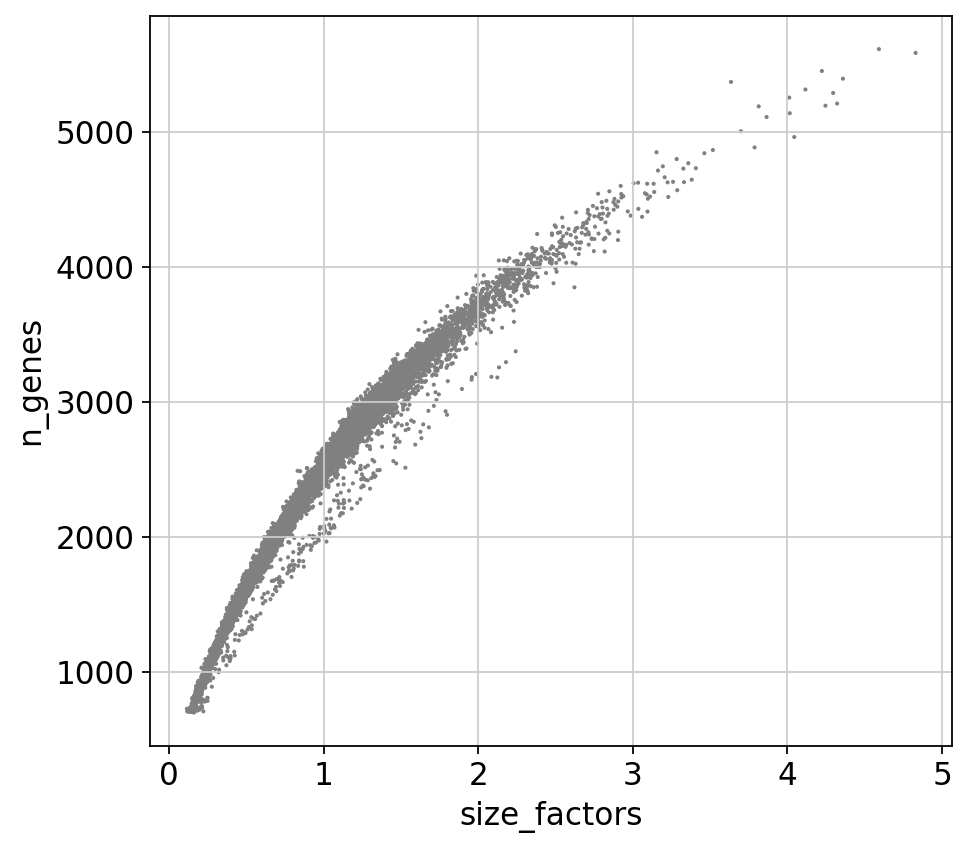

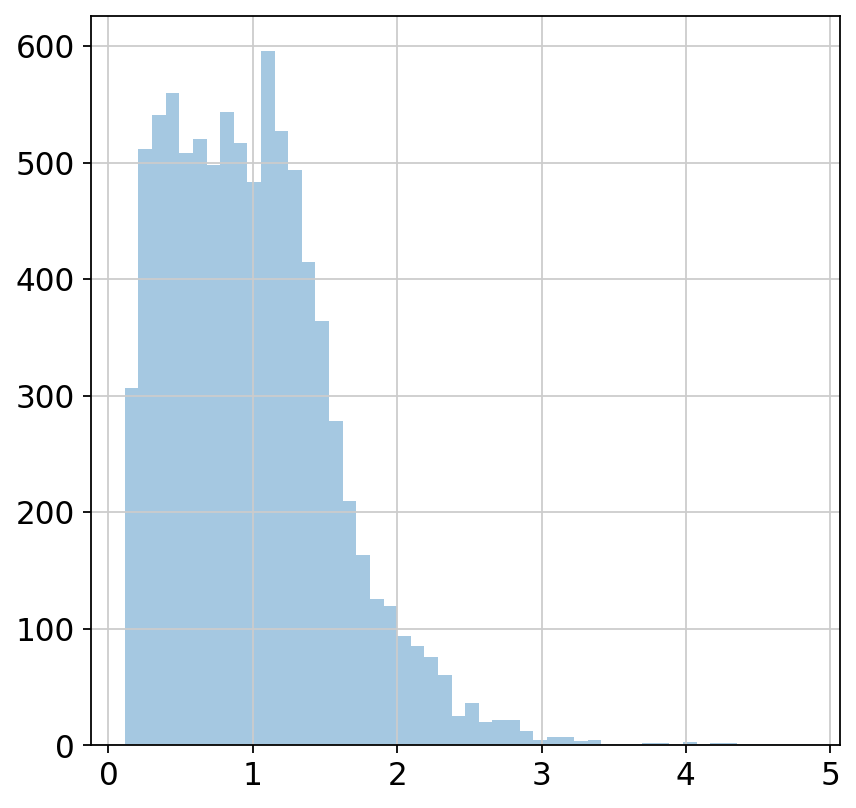

In [247]:
# Visualize the estimated size factors
morse.obs['size_factors'] = size_factors
sc.pl.scatter(morse, 'size_factors', 'n_counts')
sc.pl.scatter(morse, 'size_factors', 'n_genes')
sns.distplot(size_factors, bins=50, kde=False)
plt.show()b

In [252]:
#Keep the count data in a counts layer
morse.layers["counts"] = morse.X.copy()

In [253]:
#Normalize adata 
morse.X /= morse.obs['size_factors'].values[:,None]
sc.pp.log1p(morse)

In [260]:
morse.X = np.array(morse.X)

In [254]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
morse.raw = morse

In [303]:
type(morse.raw.X)

numpy.matrix

In [266]:
sc.pp.highly_variable_genes(morse, n_top_genes=4000)
# print('\n','Number of highly variable genes: {:d}'.format(np.sum(morse.var['highly_variable'])))

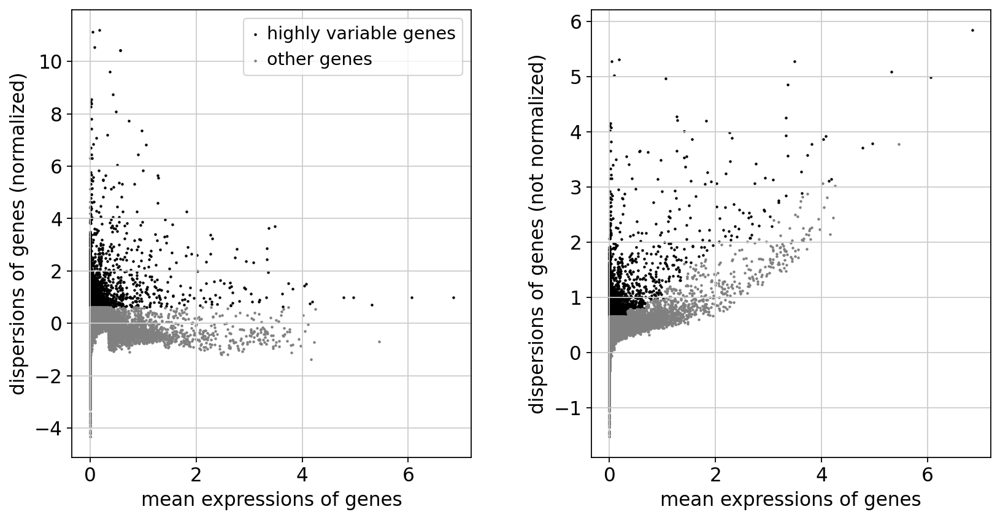

In [267]:
sc.pl.highly_variable_genes(morse)

In [268]:
# Calculate the visualizations
sc.pp.pca(morse, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(morse)

sc.tl.tsne(morse, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(morse)
sc.tl.diffmap(morse)
sc.tl.draw_graph(morse)

/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


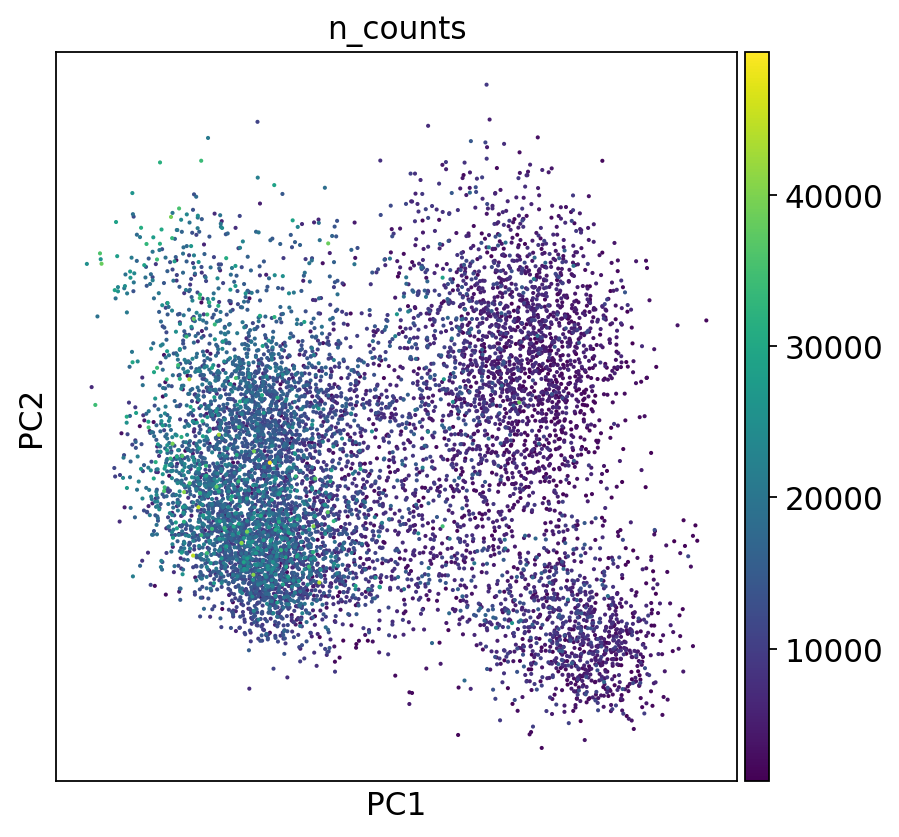

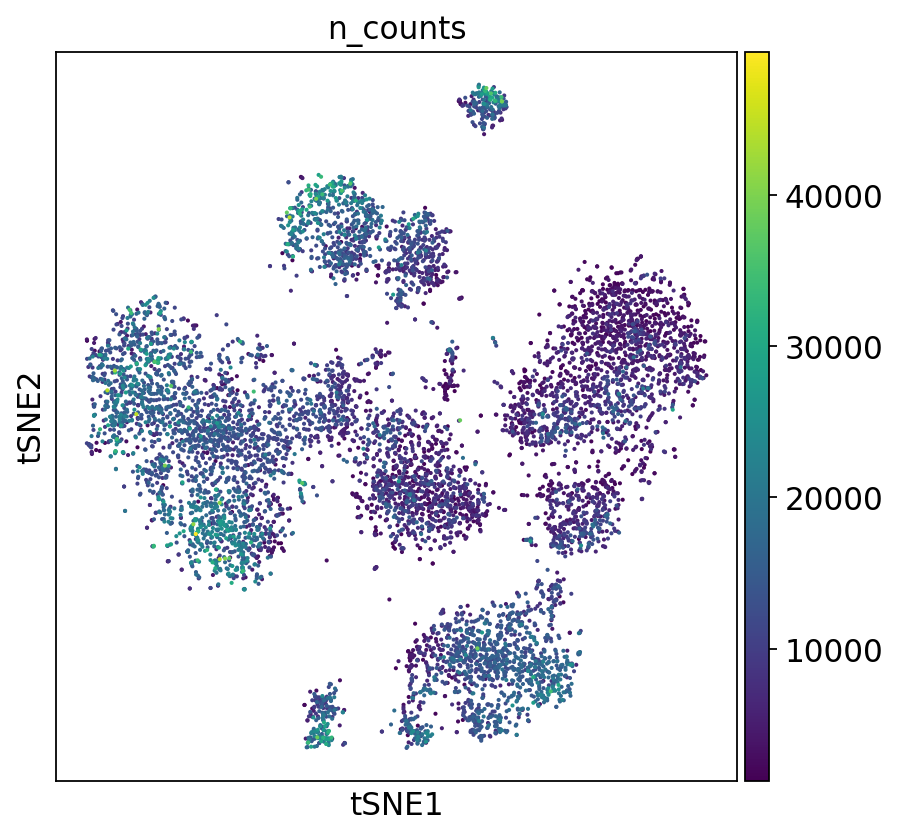

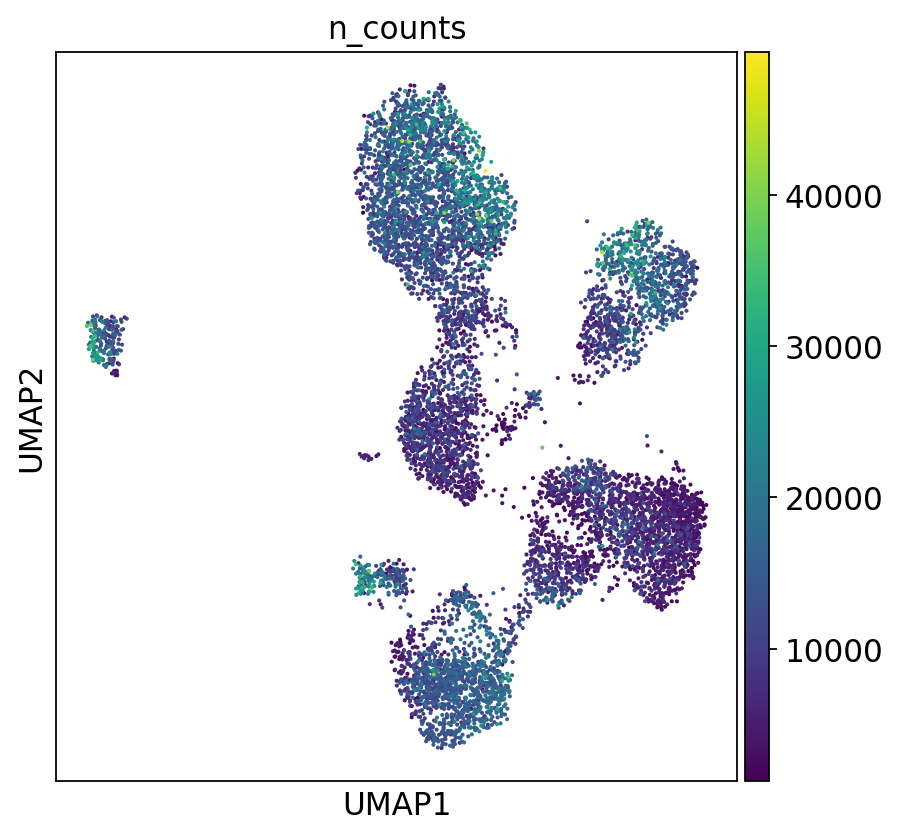

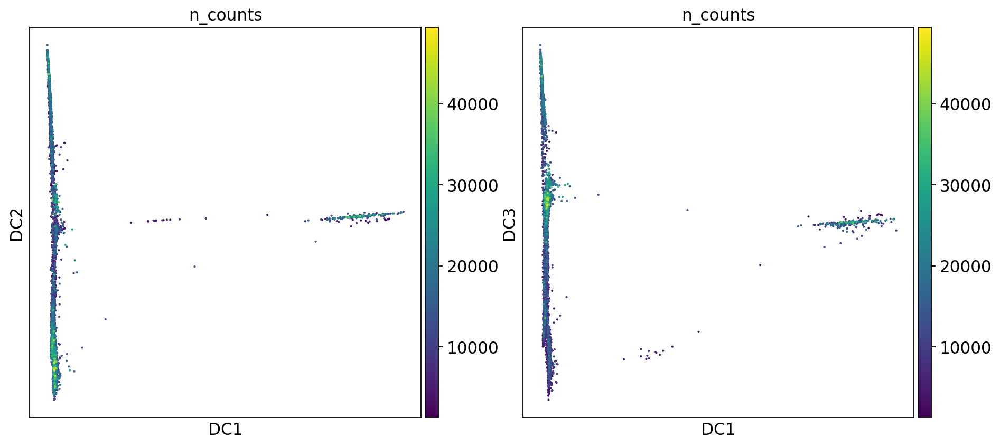

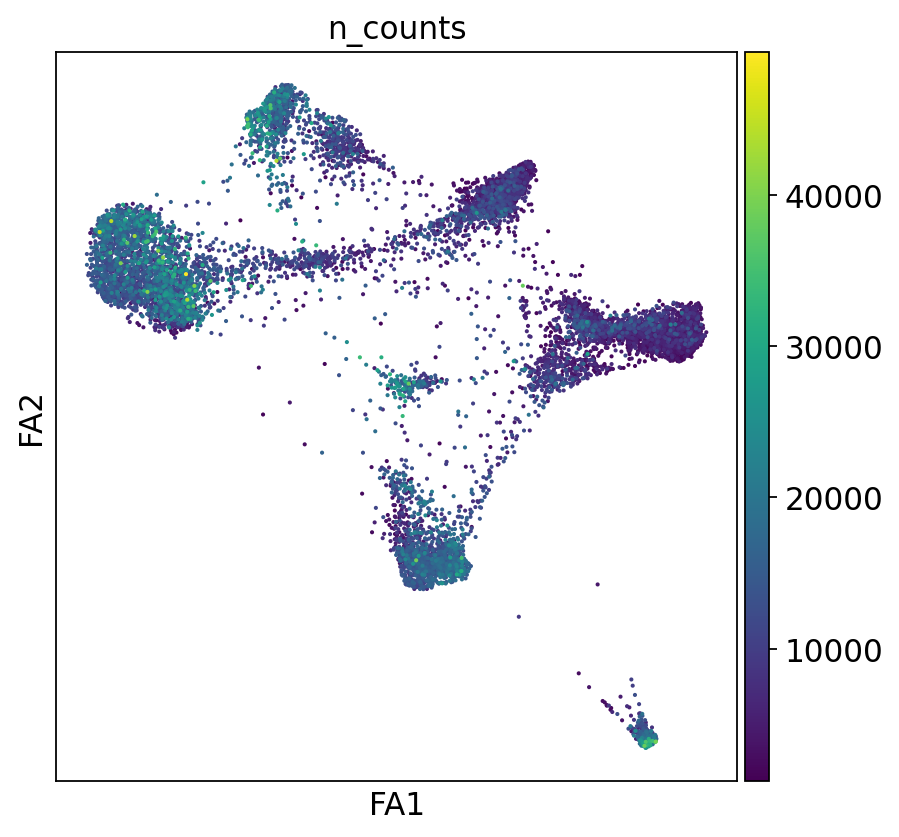

In [270]:
sc.pl.pca_scatter(morse, color='n_counts')
sc.pl.tsne(morse, color='n_counts')
sc.pl.umap(morse, color='n_counts')
sc.pl.diffmap(morse, color='n_counts', components=['1,2','1,3'])
sc.pl.draw_graph(morse, color='n_counts')

In [271]:
# Perform clustering - using highly variable genes
sc.tl.louvain(morse, key_added='louvain_r1')
sc.tl.louvain(morse, resolution=0.5, key_added='louvain_r0.5', random_state=10)

In [329]:
condition_morse = {'SC14': 'healthy',
                   'SC45': 'healthy',
                   'SC56': 'healthy',
                   'SC59': 'healthy',
                   'SC155': 'healthy',
                   'SC156': 'healthy'}
morse.obs['condition.morse'] = morse.obs['sample'].map(condition_morse)

In [272]:
morse.obs['louvain_r0.5'].value_counts()

0    2452
1    2193
2    1293
3    1122
4     983
5     360
6     191
7     186
Name: louvain_r0.5, dtype: int64

... storing 'condition.morse' as categorical


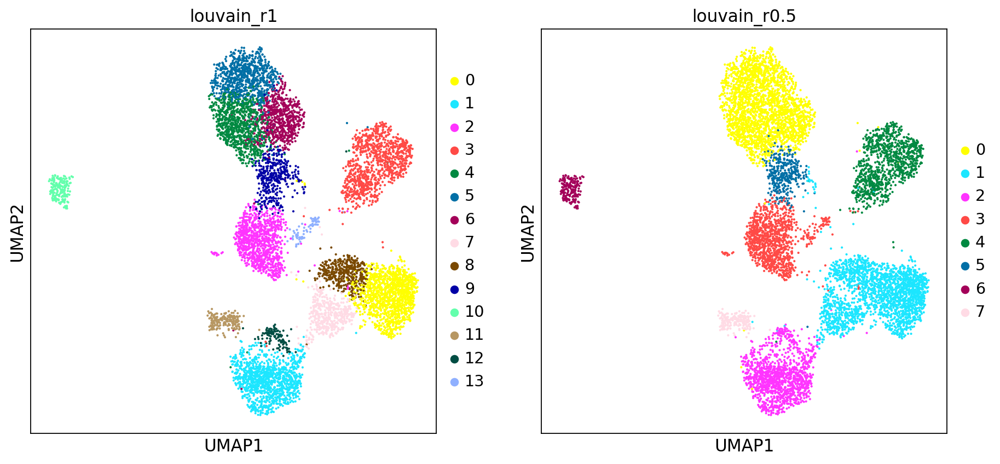

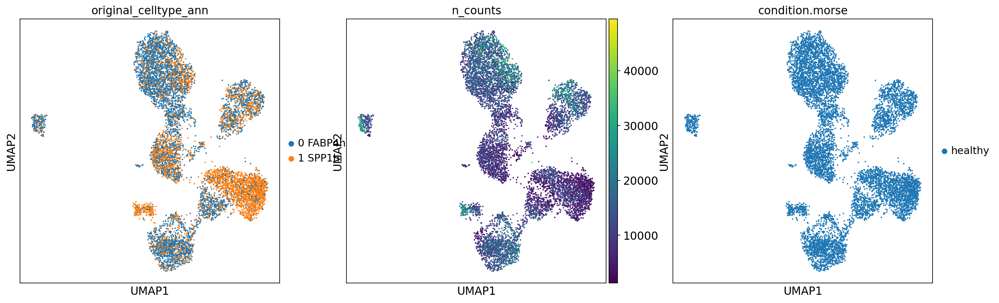

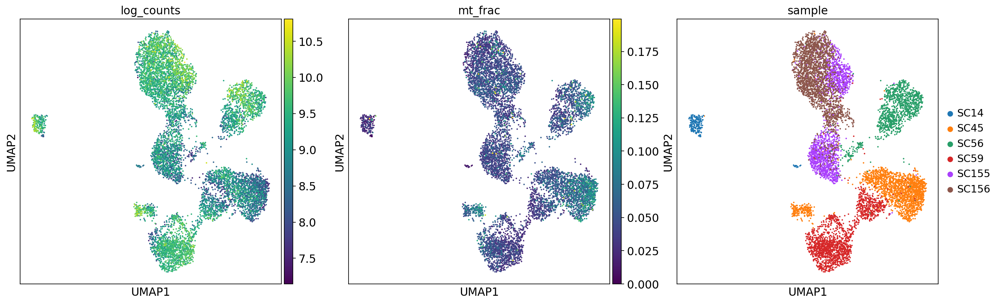

In [330]:
#Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(morse, color=['louvain_r1', 'louvain_r0.5'], palette=sc.pl.palettes.default_102)
sc.pl.umap(morse, color=['original_celltype_ann', 'n_counts', 'condition.morse'])
sc.pl.umap(morse, color=['log_counts', 'mt_frac', 'sample'])

### The following snippet of code needs to be put up otherwise this section will not run properly

In [302]:
morse.raw.X = np.array(morse.raw.X)

AttributeError: can't set attribute

In [361]:
#Calculate marker genes
sc.tl.rank_genes_groups(morse, groupby='louvain_r0.5', key_added='rank_genes_r0.5')

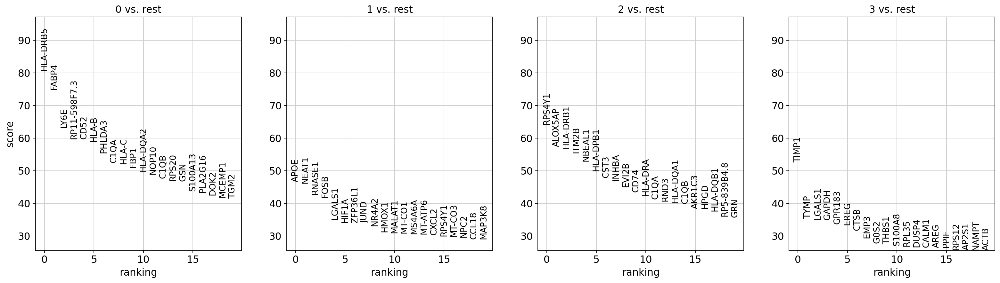

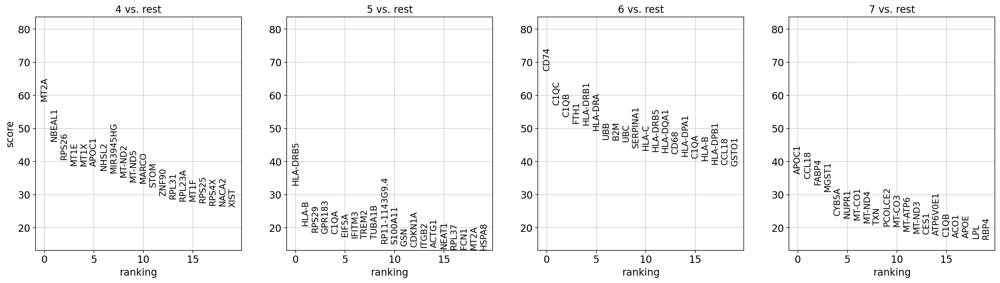

In [354]:
#Plot marker genes
sc.pl.rank_genes_groups(morse, key='rank_genes_r0.5', groups=['0', '1', '2', '3'], fontsize=12)
sc.pl.rank_genes_groups(morse, key='rank_genes_r0.5', groups=['4', '5', '6', '7'], fontsize=12)


<a id='Checking_marker_genes_saliba'></a>

### Checking marker genes proposed to be relevant

In [347]:
morse.var.index = list(morse.var.symbol)
morse.var

,ensembl,symbol,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.3,ENSG00000243485,RP11-34P13.3,False,4.166309e-05,-1.005642,-3.160652
FAM138A,ENSG00000237613,FAM138A,False,1.000000e-12,NaN,NaN
OR4F5,ENSG00000186092,OR4F5,False,1.000000e-12,NaN,NaN
RP11-34P13.7,ENSG00000238009,RP11-34P13.7,False,1.545717e-03,0.135241,-0.569083
RP11-34P13.8,ENSG00000239945,RP11-34P13.8,False,2.129082e-04,0.625689,0.544991
...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,AC233755.2,False,1.000000e-12,NaN,NaN
AC233755.1,ENSG00000275063,AC233755.1,False,1.000000e-12,NaN,NaN
AC240274.1,ENSG00000271254,AC240274.1,False,2.094467e-02,0.028609,-0.811303
AC213203.1,ENSG00000277475,AC213203.1,False,1.000000e-12,NaN,NaN


In [376]:
marker_genes = {}
marker_genes['mac.signature'] = {"TREM2", "CD9", "SPP1", "GPNMB", "LGALS3", "LGALS1", "FABP4", "FABP5", "ACP5", "PSAP",
                                 "FTH1", "LIPA", "CTSD", "CTSB", "CSTB", "CTSL", "APOE", "APOC1", "CD63", "LPL"}
marker_genes['mac.others'] = {"FTL1", "CTSC", "HEXA", "HEXB", "MMP12", "MERTK", "TYROBP", "MFGE8", "DOCK1", "ADGRB1", "IL7R"}

for k in marker_genes:
    marker_genes[k] = marker_genes[k].intersection(set(morse.var.index))
marker_genes

{'mac.signature': {'ACP5',
  'APOC1',
  'APOE',
  'CD63',
  'CD9',
  'CSTB',
  'CTSB',
  'CTSD',
  'CTSL',
  'FABP4',
  'FABP5',
  'FTH1',
  'GPNMB',
  'LGALS1',
  'LGALS3',
  'LIPA',
  'LPL',
  'PSAP',
  'SPP1',
  'TREM2'},
 'mac.others': {'ADGRB1',
  'CTSC',
  'DOCK1',
  'HEXA',
  'HEXB',
  'IL7R',
  'MERTK',
  'MFGE8',
  'MMP12',
  'TYROBP'}}

In [352]:
morse.var

,ensembl,symbol,highly_variable,means,dispersions,dispersions_norm
RP11-34P13.3,ENSG00000243485,RP11-34P13.3,False,4.166309e-05,-1.005642,-3.160652
FAM138A,ENSG00000237613,FAM138A,False,1.000000e-12,NaN,NaN
OR4F5,ENSG00000186092,OR4F5,False,1.000000e-12,NaN,NaN
RP11-34P13.7,ENSG00000238009,RP11-34P13.7,False,1.545717e-03,0.135241,-0.569083
RP11-34P13.8,ENSG00000239945,RP11-34P13.8,False,2.129082e-04,0.625689,0.544991
...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,AC233755.2,False,1.000000e-12,NaN,NaN
AC233755.1,ENSG00000275063,AC233755.1,False,1.000000e-12,NaN,NaN
AC240274.1,ENSG00000271254,AC240274.1,False,2.094467e-02,0.028609,-0.811303
AC213203.1,ENSG00000277475,AC213203.1,False,1.000000e-12,NaN,NaN


In [362]:
cell_annotation = sc.tl.marker_gene_overlap(morse, marker_genes, key='rank_genes_r0.5', top_n_markers=100)
cell_annotation

,0,1,2,3,4,5,6,7
mac.signature,3.0,4.0,1.0,5.0,5.0,2.0,6.0,9.0
mac.others,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0


<AxesSubplot:>

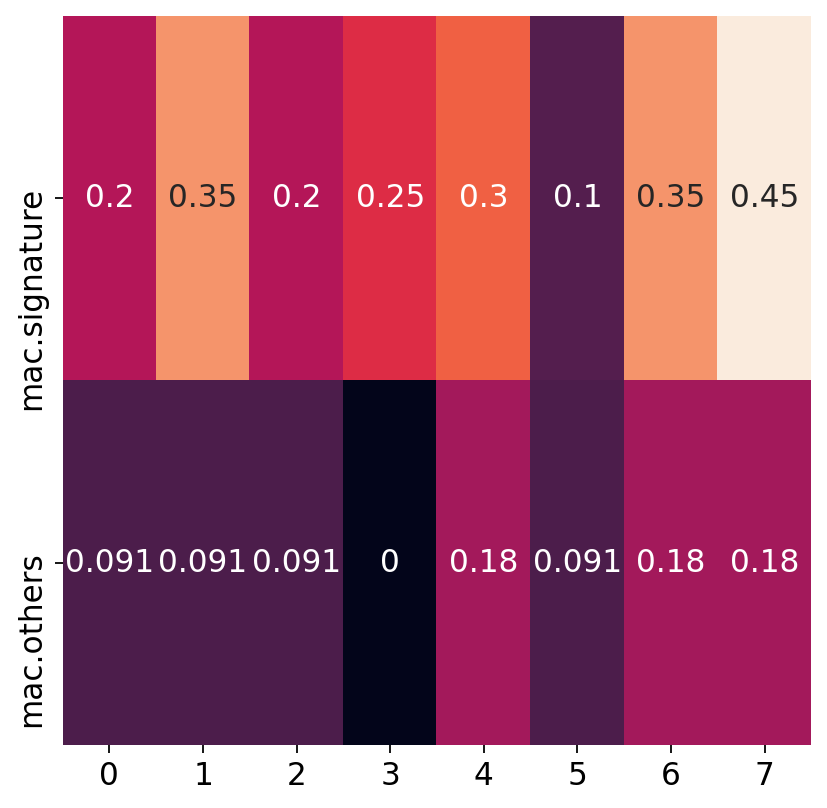

In [364]:
cell_annotation_norm = sc.tl.marker_gene_overlap(morse, marker_genes, key='rank_genes_r0.5', normalize='reference', top_n_markers=200)
sns.heatmap(cell_annotation_norm, cbar=False, annot=True)

In [389]:
from matplotlib import colors
#Define a nice colour map for gene expression
colors_red = plt.cm.Reds(np.linspace(0, 1, 128))
colors_blue = plt.cm.Blues(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors_red])
mymap_red = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
colorsComb = np.vstack([colors3, colors_blue])
mymap_blue = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)


In [378]:
morse.var_names_make_unique()

In [384]:
for k in marker_genes:
    print(k)
    sc.tl.score_genes(morse, list(marker_genes[k])) #  ctrl_size=50, gene_pool=None, n_bins=25, score_name='score', random_state=0, copy=False, use_raw=None)
    morse.obs['score.' + k] = morse.obs['score']
    del morse.obs['score']

mac.signature


/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


mac.others


/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


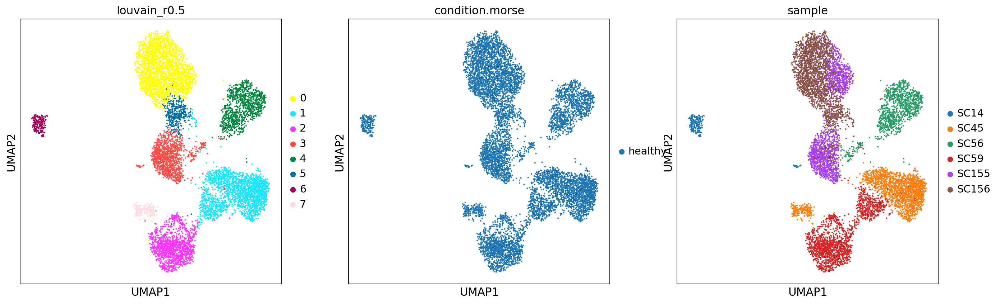

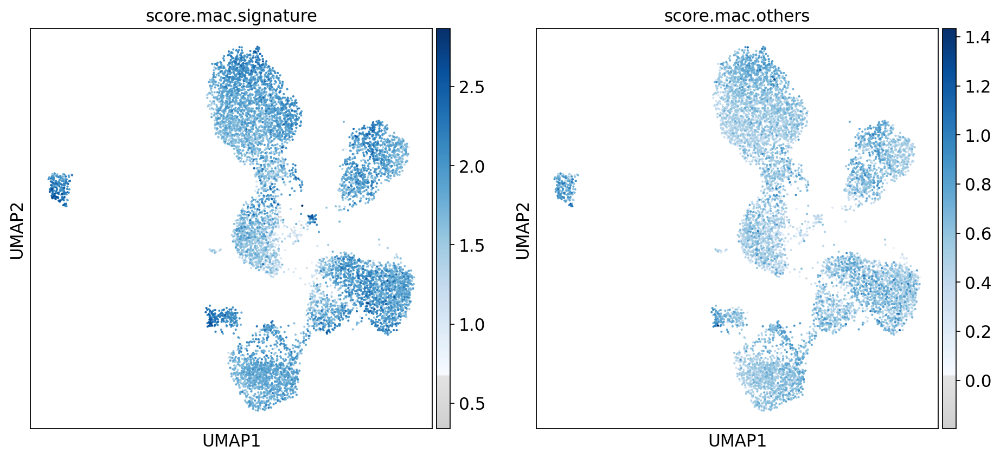

In [395]:
sc.pl.umap(morse, color=['louvain_r0.5', 'condition.morse', 'sample'], cmap=mymap) # ['original_celltype_ann', 'n_counts', 'condition.morse']
sc.pl.umap(morse, color=['score.mac.signature', 'score.mac.others'], cmap=mymap_blue) # ['original_celltype_ann', 'n_counts', 'condition.morse']

/home/icb/ignacio.ibarra/miniconda3/envs/mypython3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


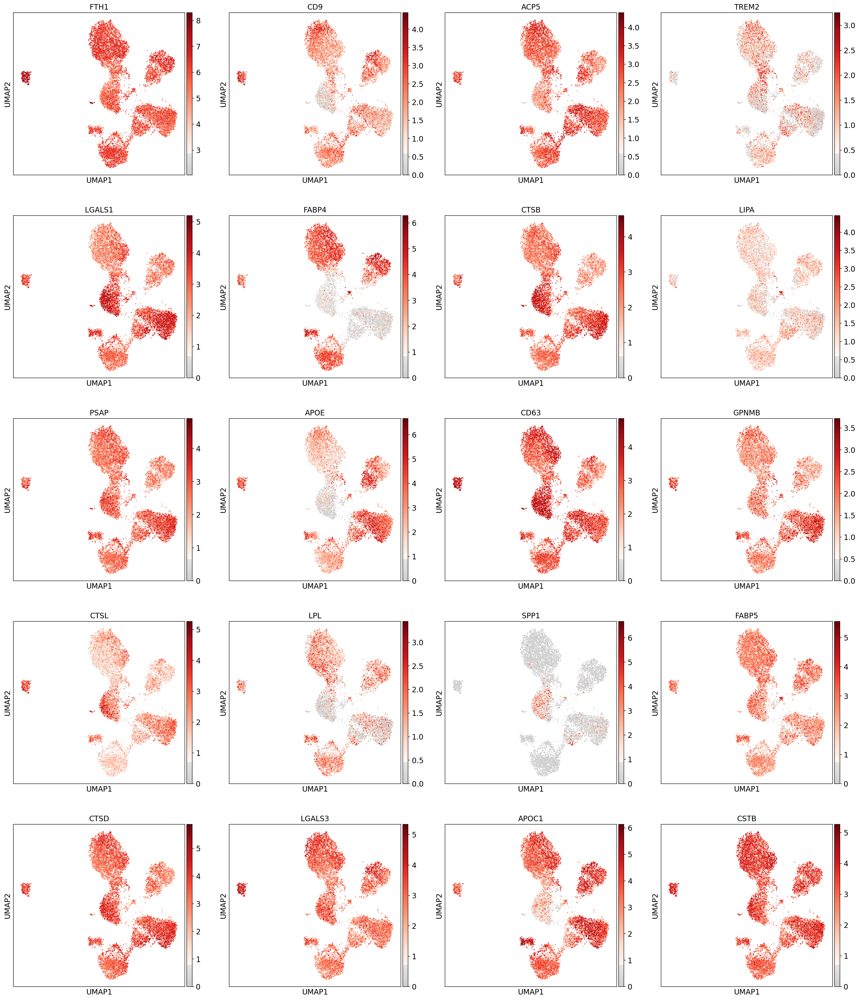

In [385]:
sc.pl.umap(morse, color=marker_genes['mac.signature'], cmap=mymap) # ['original_celltype_ann', 'n_counts', 'condition.morse']

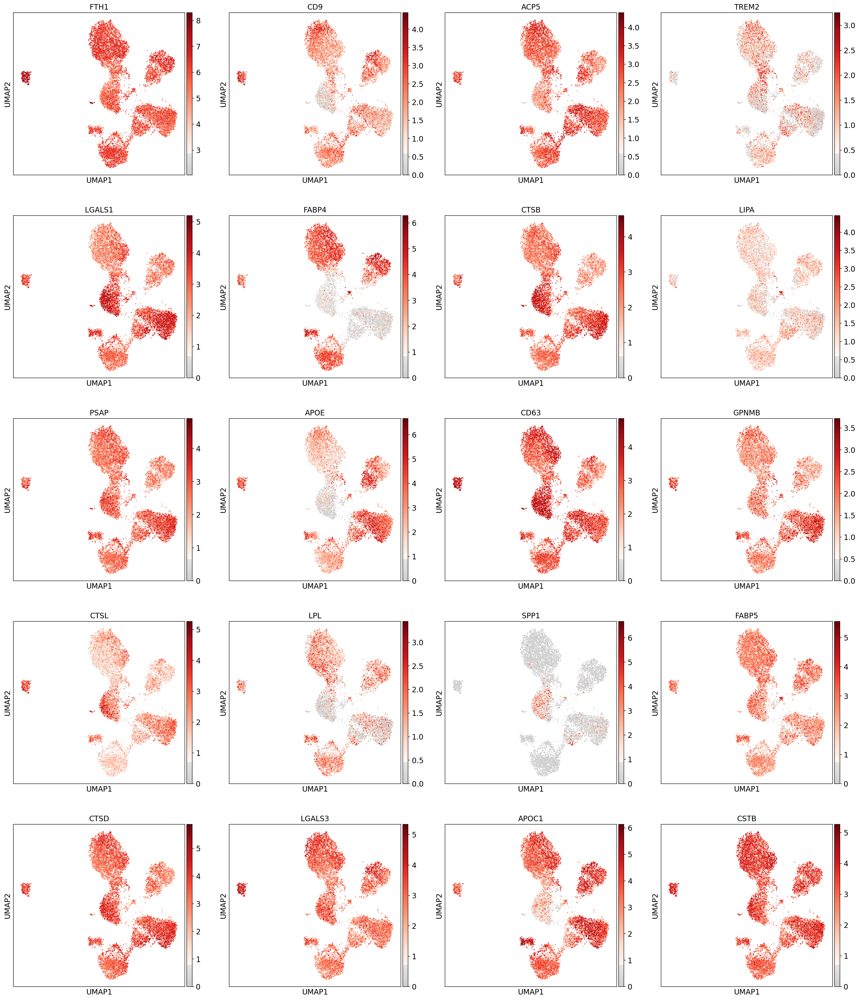

In [383]:
sc.pl.umap(morse, color=marker_genes['mac.signature'], cmap=mymap) # ['original_celltype_ann', 'n_counts', 'condition.morse']